In [1]:
import os, sys
import pandas as pd
from pandas import DataFrame
import numpy as np
from IPython.display import HTML, Image
import re

In [2]:
from test_partitions import get_last_testdir, set_test_dir, calc_scores, gather_outputs, get_times_df

In [3]:
# %load_ext autoreload
# %autoreload 2

In [4]:
if "testResults" not in os.listdir(os.curdir):
    rootdir = os.path.abspath("..")
    os.chdir(rootdir)
    set_test_dir("ptest_2023-11-9_10-46-32")
from test_partitions import test_dir
test_dir

'testResults/ptest_2023-11-9_10-46-32'

In [5]:
scores_df = calc_scores()

Scores saved to testResults/ptest_2023-11-9_10-46-32/scores.csv


In [6]:
def highlight_min(s: pd.Series):
    sorted = s.sort_values(ascending=True)    
    styles = []
    for val in s:
        if val == sorted.iloc[0]:
            styles.append('background: darkgreen')
        elif val == sorted.iloc[1]:
            styles.append('background: darkblue')
        elif val == sorted.iloc[-1]:
            styles.append('background: #330000')
        else:
            styles.append('')
          
    return styles

scores_df_s = scores_df.iloc[:, :7]

# scores_df_s["namee"] = scores_df_s.name.apply(lambda x: x.split("V:")[0].strip())
# scores_df_s["namev"] = scores_df_s.name.apply(lambda x: "V:" + x.split("V:")[1].strip())
# scores_df_s = scores_df_s.drop(columns=["name"])

# scores_df_s = pd.merge(scores_df_s[["namee", "namev"]], scores_df_s.drop(columns=["namee", "namev"]), left_index=True, right_index=True)

scores_df_s.style.apply(
    highlight_min,
    subset=list(filter(lambda x: not x.startswith("name"), scores_df_s.columns)), 
    axis=0,
)

,name,vnum_std,vnum_max_diff,stime_std,stime_max,ctime_std,ctime_max
id,,,,,,,
0,E: V:,19.081786,41.765557,0.631231,2.919000,0.964459,4.750000
1,E: V: connections,19.279089,40.109353,0.744019,2.827000,1.502969,5.330000
2,E: V: connexp,17.306231,37.659275,0.419575,2.447000,1.910904,6.188000
3,"E: V: connections,connexp",17.306231,37.659275,0.475799,2.571000,1.998144,6.247000
4,E: route-num V:,18.564194,39.318424,0.706540,2.932000,1.357428,5.305000
5,E: route-num V: connections,10.496657,23.268008,0.409423,2.356000,0.796722,5.728000
6,E: route-num V: connexp,15.752001,35.816030,0.527388,2.399000,1.145202,6.392000
7,"E: route-num V: connections,connexp",15.736464,35.787419,0.448664,2.134000,1.173340,6.433000
8,E: osm V:,16.816220,35.875845,0.723077,2.939000,1.357785,5.468000


In [7]:
def highlight_min(s: pd.Series):
    sorted = s.sort_values(ascending=True)    
    styles = []
    for val in s:
        if val == sorted.iloc[0]:
            styles.append('cellcolor: {green}')
        # elif val == sorted.iloc[1]:
        #     styles.append('cellcolor: {lightblue}')
        elif val == sorted.iloc[-1]:
            styles.append('cellcolor: {red}')
        else:
            styles.append('')
          
    return styles

def makecell(s: str):
    return "\\makecell{" + s.replace("\n", "\\\\") + "}"

dft = scores_df_s.rename(
    columns={
        "name": "Weights used (Edges and Vertices)",
        "vnum_std": makecell("V.num\n$\sigma$"),
        "vnum_max_diff": makecell("V.num\nmax diff."),
        "stime_std": makecell("sim.\n$t$\space$\sigma$"),
        "stime_max": makecell("sim.\n$t$ max"),
        "ctime_std": makecell("comm.\n$t$\space$\sigma$"),
        "ctime_max": makecell("comm.\n$t$ max"),
    }
).reset_index(drop=True).round(2)

styler = dft.style.apply(
    highlight_min,
    subset=list(filter(lambda x: "Weights" not in x, dft.columns)), 
    axis=0,
).map_index(lambda v: "bfseries: ;", axis="columns"
).format(precision=2
).hide(axis="index"
)
styler.to_latex(
    "../elaborato/chap4_results_table.tex",
    hrules=True,
    siunitx=True,
    clines="all;data",
)

In [8]:
select = 5

In [9]:
seldir = os.path.join(test_dir, [dirn for dirn in os.listdir(test_dir) if re.sub(r'^0+', '', dirn).startswith(str(select))][0])
results_file = os.path.join(seldir, "output.html")

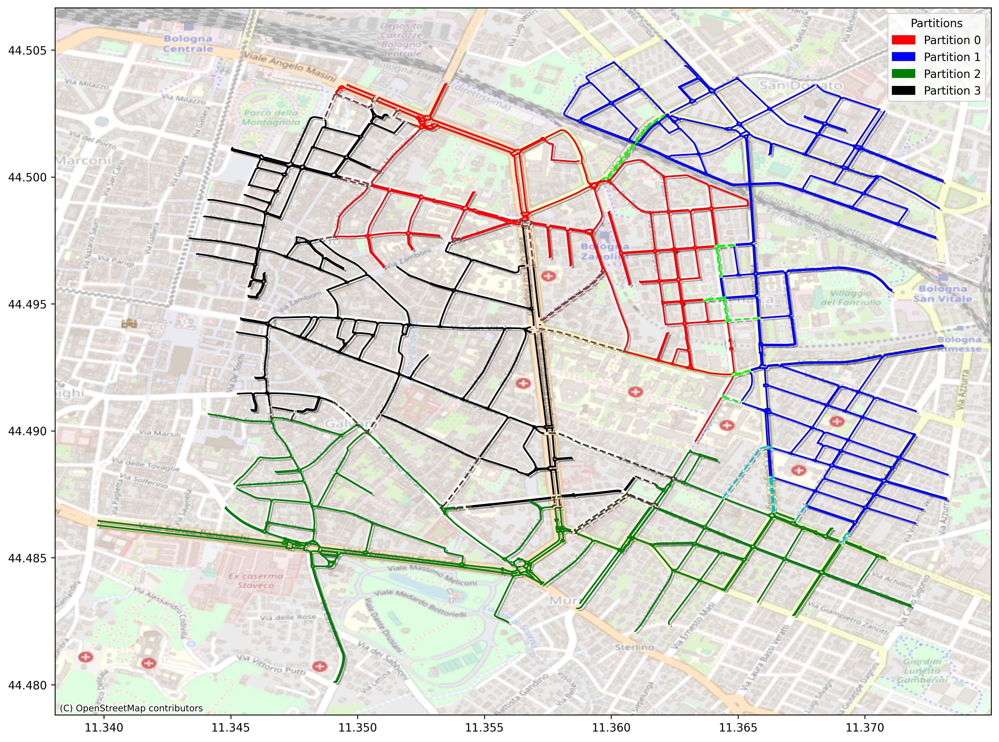

In [10]:
# from urllib.parse import quote

# with open(results_file, 'r') as f:
#     content = f.read()
#     content = content.replace('"./', f'"{quote(seldir)}/')
    # display(HTML(content))
    
Image(os.path.join(seldir, "partitions.png"))

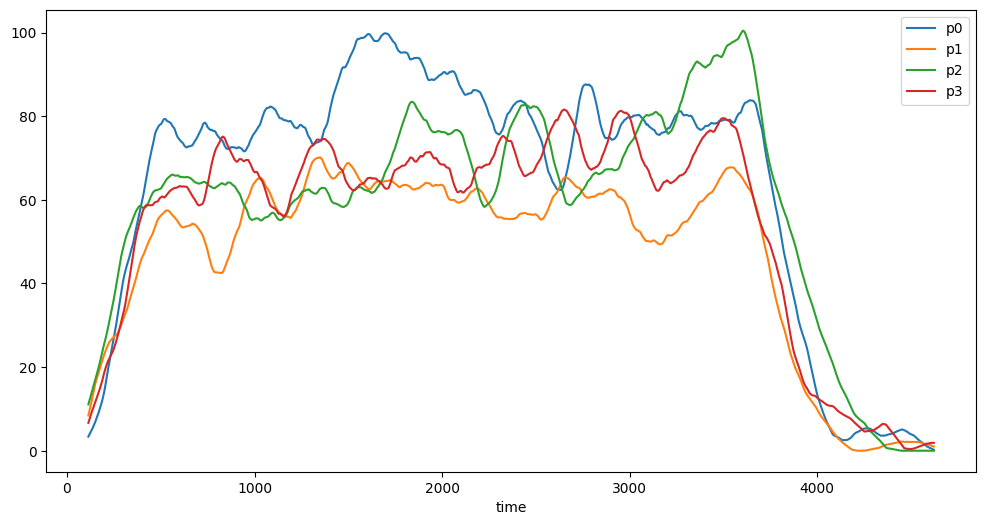

In [11]:
display(Image(os.path.join(seldir, "allStepVehicles.png")))

In [16]:
times_df = get_times_df()
times_df

,p0,p1,p2,p3
E: route-num V: connexp,2.399,1.188,1.857,2.177
E: V:,2.919,2.078,1.636,1.532
"E: route-num,osm V: connections,connexp",1.471,2.171,2.629,1.398
E: route-num V:,2.489,2.932,1.629,1.441
E: osm V: connections,2.576,2.647,1.662,1.387
"E: route-num,osm V:",2.760,2.680,1.475,1.567
"E: V: connections,connexp",2.571,2.348,1.755,1.568
E: V: connections,1.305,2.328,1.373,2.827
E: route-num V: connections,2.356,1.440,2.091,1.683
E: V: connexp,2.447,2.151,1.508,1.736


Text(0, 0.5, 'seconds')

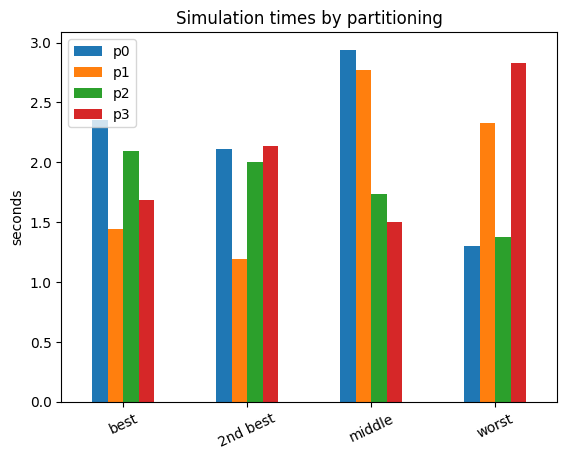

In [31]:
times_df_plot = pd.DataFrame(columns=times_df.columns)
times_df_plot.loc["best", :] = times_df.loc["E: route-num V: connections", :]
times_df_plot.loc["2nd best", :] = times_df.loc["E: route-num V: connections,connexp", :]
times_df_plot.loc["middle", :] = times_df.loc["E: osm V: ", :]
times_df_plot.loc["worst", :] = times_df.loc["E:  V: connections", :]

ax = times_df_plot.plot.bar(
    title="Simulation times by partitioning",
    rot=25,
)
ax.set_ylabel("seconds")